In [32]:
import xarray as xr
import xscen as xs
import glob
from xscen import CONFIG
import numpy as np
from matplotlib import pyplot as plt
import figanos.matplotlib as fg
import random
import cartopy.crs as ccrs


xs.load_config("../config/config_general.yml", "../config/config_region.yml", "../config/paths.yml")
source=['ACCESS-CM2', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-ESM2-1',   'INM-CM5-0', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', ]
exp=['ssp245','ssp370']

# Health checks

In [27]:

for f in glob.glob(f'{CONFIG['paths']['final']}/checks/*/*'):
    print(f.split("/")[-1])
    ds= xr.open_zarr(f)
    for var in ds.data_vars:
        if ds[var].values:
            print(var, ds[var].values)


CMIP6_ScenarioMIP_CMCC_CMCC-ESM2_ssp245_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_MIROC_MIROC6_ssp245_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_CSIRO-ARCCSS_ACCESS-CM2_ssp245_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_MRI_MRI-ESM2-0_ssp245_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_CSIRO_ACCESS-ESM1-5_ssp245_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_CNRM-CERFACS_CNRM-ESM2-1_ssp245_r1i1p1f2_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_DKRZ_MPI-ESM1-2-HR_ssp370_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_CNRM-CERFACS_CNRM-CM6-1_ssp245_r1i1p1f2_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_MPI-M_MPI-ESM1-2-LR_ssp370_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_CMCC_CMCC-ESM2_ssp370_r1i1p1f1_global+CaSRv32+lait-C3_checks.zarr.zip
CMIP6_ScenarioMIP_MIROC_MIROC6_ssp370_r1i1p1f1_global+CaSRv32+lait-C3_checks.zar

# diagnostiques VALUE


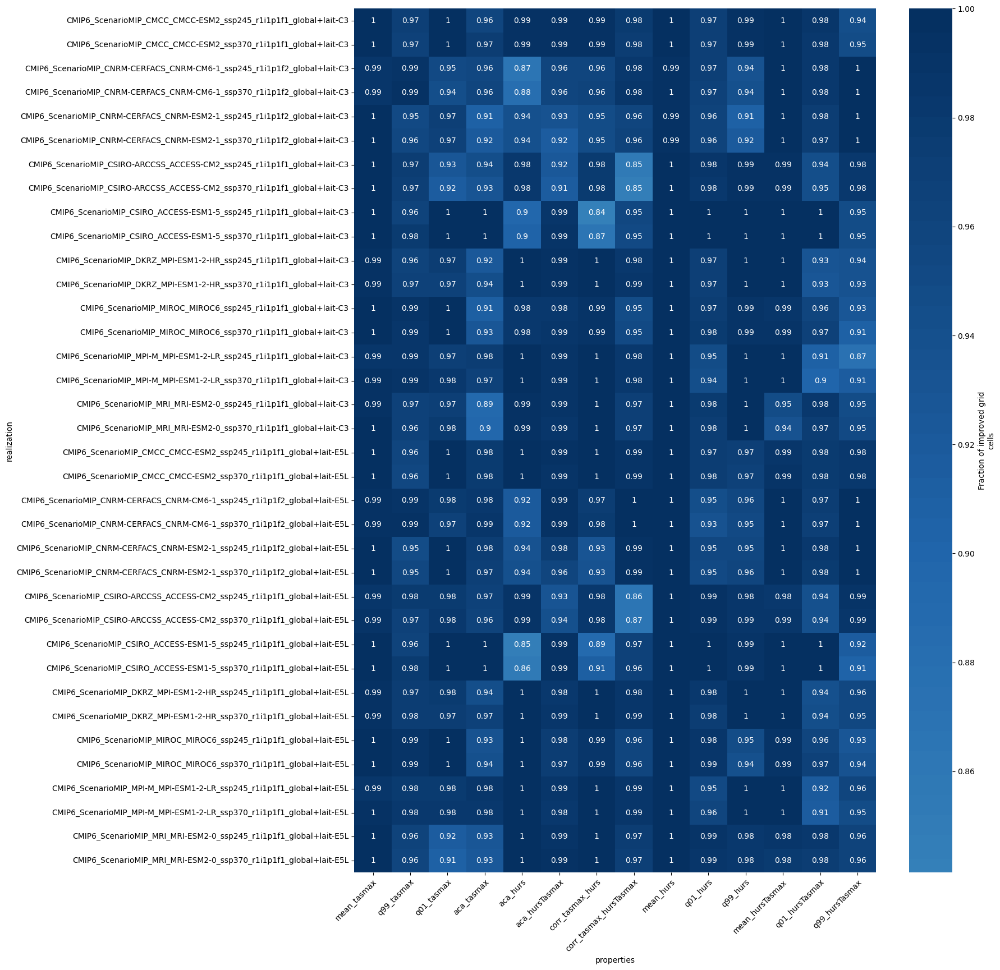

In [28]:
imps=[]
for r in ['lait-C3','lait-E5L',]:
    for f in np.sort(glob.glob(f"{CONFIG['paths']['final']}/diagnostics/*/{r}/*/CMIP6*/*imp.zarr.zip")):
        imp=xr.open_zarr(f, decode_timedelta=False)
        imp=imp.expand_dims(realization=[f"{imp.attrs['cat:id']}+{r}"])
        imp=imp.drop_vars('rotated_pole', errors='ignore')
        imps.append(imp)

ds_imp= xr.concat(imps, dim='realization')
ax=fg.heatmap(ds_imp,plot_kw={'annot':True, }, fig_kw={'figsize':(15,20)}, divergent=0.5)


# plot 1 day

/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.py:287: UserWarning: Attribute "description" not found.
/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.py:287: UserWarning: Attribute "description" not found.
/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.py:287: UserWarning: Attribute "description" not found.
/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.py:287: UserWarning: Attribute "description" not found.
/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.py:287: UserWarning: Attribute "description" not found.
/lustre06/project/6046550/scenario/environnements/envs/xscen-0.14/lib/python3.12/site-packages/figanos/matplotlib/utils.

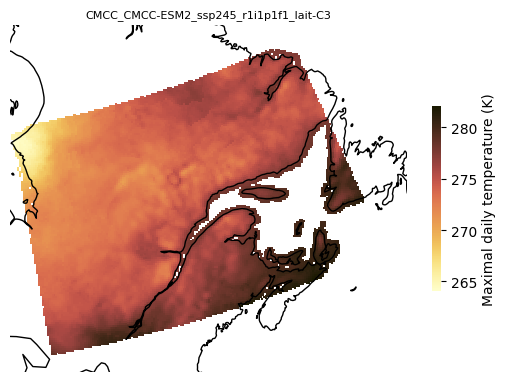

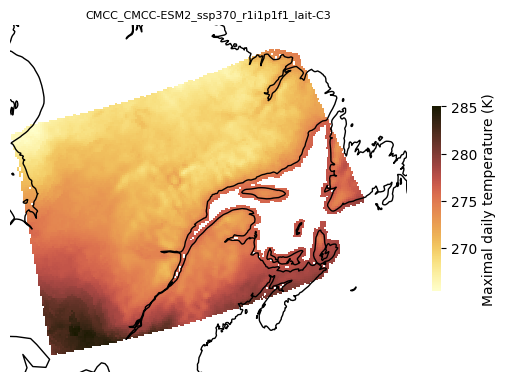

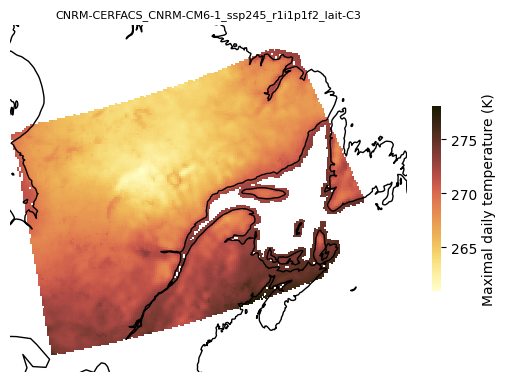

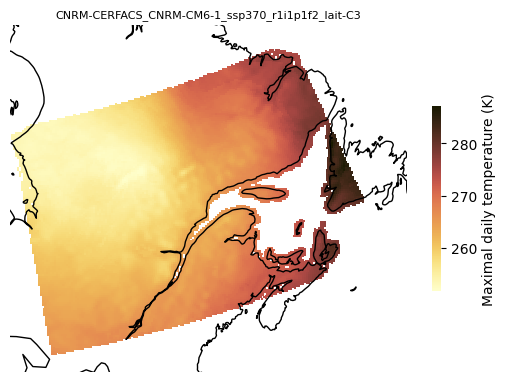

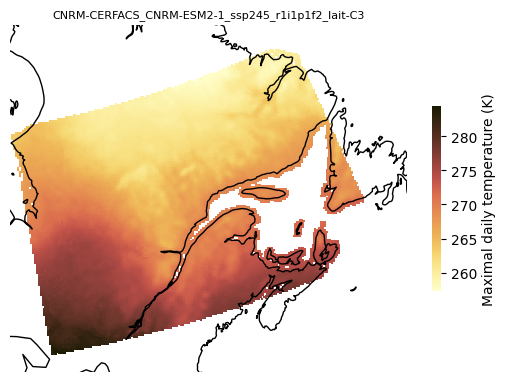

...

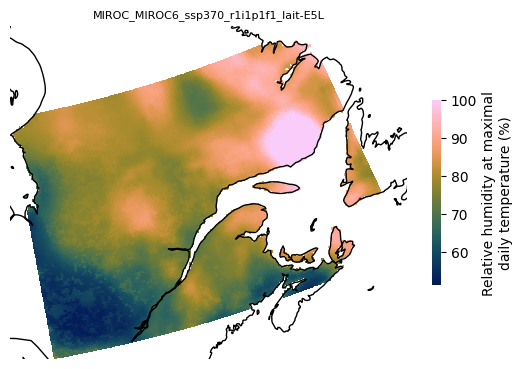

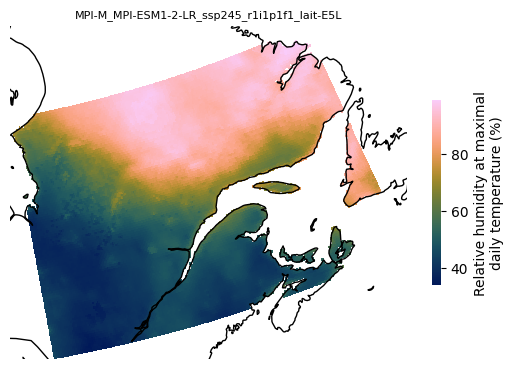

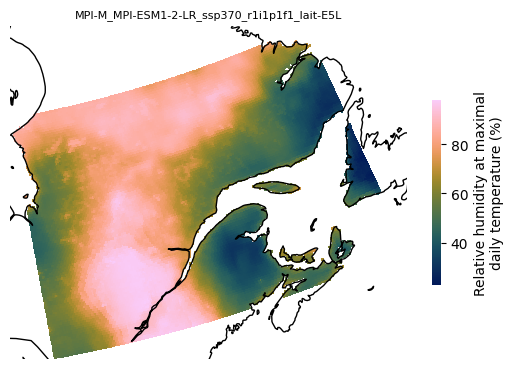

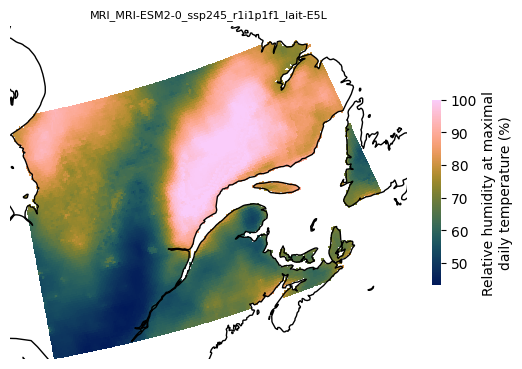

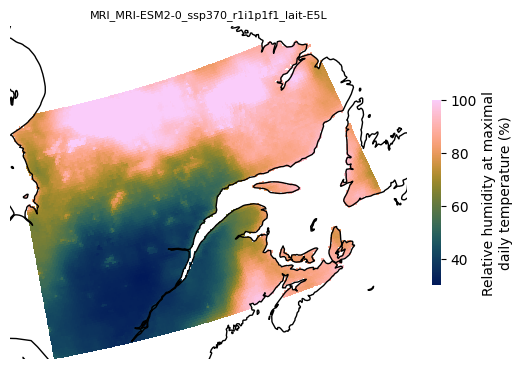

In [37]:
time_coder = xr.coders.CFDatetimeCoder(use_cftime=True)
for var in ['tasmax','hurs', 'hursTasmax']:
    for f in np.sort(glob.glob(f"{CONFIG['paths']['final']}/staging/simulation/biasadjusted/*/*/*/*/*/*/*/*/*/*/*{var}*")):
        ds=xr.open_zarr(f, decode_times=time_coder)
        ax=fg.gridmap(ds.isel(time=random.randint(0, len(ds.time))),plot_kw={ "cbar_kwargs": {"shrink": 0.5,}},
                      features={ 'lakes':{'scale':'110m', 'edgecolor':'black', 'facecolor':'none'},'coastline':{'scale':'50m'}}  )
        ax.set_title(ds.attrs['cat:id'].replace('CMIP6_ScenarioMIP_','').replace('global',ds.attrs['cat:domain']), fontsize=8)
